# Проект по анализу данных с сайта Лента(https://lenta.ru/)

Подключаем библиотеки.

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import datetime
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")
sns.set(style="darkgrid")
%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kukof\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Загружаем dataframe, полученные с помощью парсинга. Объединим данные в один dataframe.

In [3]:
df_f_all = pd.read_pickle('df_f_all.p', compression='gzip')
df_4_6_8 = pd.read_pickle('df_4_6_8.p', compression='gzip')
df_10_12_14 = pd.read_pickle('df_10_12_14.p', compression='gzip')
df_16_20_22 = pd.read_pickle('df_16_20_22.p', compression='gzip')
df = pd.concat([df_f_all, df_4_6_8, df_10_12_14,df_16_20_22 ])
df.head()

,url,source,title,content,datetime,topic,year,month,weekday,len_title,len_content,lifetime,id
0,https://lenta.ru//news/2023/10/22/v-velikobrit...,lenta,В Великобритании слили в сеть личный номер тел...,Личный номер телефона премьер-министра Великоб...,2023-10-22 00:00:00,world/crime,2023.0,October,Sunday,68.0,674.0,7635.0,NaN
1,https://lenta.ru//news/2023/10/22/kitay-vyyavi...,lenta,Китай выявил шпионившего в пользу США на оборо...,Спецслужбы Китая выявили случай шпионажа в пол...,2023-10-22 00:00:00,world/crime,2023.0,October,Sunday,62.0,1063.0,7635.0,NaN
2,https://lenta.ru//news/2023/10/17/v-belgii-lik...,lenta,В Бельгии ликвидировали подозреваемого в напад...,"Полиция в Бельгии нейтрализовала человека, кот...",2023-10-17 00:00:00,world/crime,2023.0,October,Tuesday,61.0,842.0,14835.0,NaN
3,https://lenta.ru//news/2023/10/16/missiyu-oon-...,lenta,Миссию ООН обокрали в секторе Газа,Ближневосточное агентство ООН для помощи палес...,2023-10-16 00:00:00,world/crime,2023.0,October,Monday,34.0,1136.0,16275.0,NaN
4,https://lenta.ru//news/2023/10/13/vo-frantsii-...,lenta,Во Франции задержали еще одного человека с нож...,Французская полиция задержала еще одного воору...,2023-10-13 00:00:00,world/crime,2023.0,October,Friday,64.0,852.0,20595.0,NaN


Удалим id новостей.

In [4]:
df.drop(columns='id', inplace=True)
df = df.reset_index(drop=True)
df.head()

,url,source,title,content,datetime,topic,year,month,weekday,len_title,len_content,lifetime
0,https://lenta.ru//news/2023/10/22/v-velikobrit...,lenta,В Великобритании слили в сеть личный номер тел...,Личный номер телефона премьер-министра Великоб...,2023-10-22 00:00:00,world/crime,2023.0,October,Sunday,68.0,674.0,7635.0
1,https://lenta.ru//news/2023/10/22/kitay-vyyavi...,lenta,Китай выявил шпионившего в пользу США на оборо...,Спецслужбы Китая выявили случай шпионажа в пол...,2023-10-22 00:00:00,world/crime,2023.0,October,Sunday,62.0,1063.0,7635.0
2,https://lenta.ru//news/2023/10/17/v-belgii-lik...,lenta,В Бельгии ликвидировали подозреваемого в напад...,"Полиция в Бельгии нейтрализовала человека, кот...",2023-10-17 00:00:00,world/crime,2023.0,October,Tuesday,61.0,842.0,14835.0
3,https://lenta.ru//news/2023/10/16/missiyu-oon-...,lenta,Миссию ООН обокрали в секторе Газа,Ближневосточное агентство ООН для помощи палес...,2023-10-16 00:00:00,world/crime,2023.0,October,Monday,34.0,1136.0,16275.0
4,https://lenta.ru//news/2023/10/13/vo-frantsii-...,lenta,Во Франции задержали еще одного человека с нож...,Французская полиция задержала еще одного воору...,2023-10-13 00:00:00,world/crime,2023.0,October,Friday,64.0,852.0,20595.0


Посмотрим на размер итогового dataframe.

In [5]:
df.shape

(49560, 12)

Посчитаем кол-во дублей новостей и удалим их.

In [6]:
print(len(df[df.duplicated()]))
df = df.drop_duplicates()

21327


Проверим, есть ли пропуски в данных.

In [7]:
df.isnull().sum()

url                0
source             0
title              0
content            0
datetime           0
topic              0
year           10005
month          10005
weekday        10005
len_title      23665
len_content    23665
lifetime       23665
dtype: int64

Посмотрим на размер итогового dataframe после удаления дублей.

In [8]:
df.shape

(28233, 12)

Посмотрим на типы топиков, так как мы парсили их из разделов, нужно объединить разделы в основной.

In [9]:
df.topic.value_counts()

topic
sport/boxing              782
sport/winter              768
sport/auto                763
media/tv                  754
media/press               749
                         ... 
economics/social           54
wellness/mental_health     49
culture/series/            48
life/food                  45
culture/photographic/      36
Name: count, Length: 86, dtype: int64

Проведем замену по словарю значений.Проверим, у всех ли новостей есть значение topic.

In [10]:
dict = {'travel/rus' : 'travel','travel/world' : 'travel','travel/events' : 'travel','travel/accident' : 'travel','travel/opinion' : 'travel','style/look' : 'travel', 'sport/football' : 'sport', 'sport/boxing' : 'sport', 'sport/winter' : 'sport','sport/other' : 'sport','sport/hockey' : 'sport','sport/auto' : 'sport','sport/olympiad' : 'sport','sport/fitness' : 'sport', 'economics/economy' : 'economics', 'economics/companies' : 'economics', 'economics/markets' : 'economics', 'economics/finance' : 'economics', 'economics/business_climate' : 'economics', 'economics/social' : 'economics','economics/crypto' : 'economics','economics/investments' : 'economics','science/science' : 'science', 'science/inrussia' : 'science','science/cosmos' : 'science', 'science/mil' : 'science','science/history' : 'science', 'science/natural' : 'science' , 'science/future' : 'science', 'science/digital' : 'science','science/gadget' : 'science', 'science/games' : 'science' , 'science/soft' : 'science','culture/kino' : 'culture', 'culture/series' : 'culture', 'culture/music/' : 'culture', 'culture/books/' : 'culture', 'culture/art/' : 'culture','culture/theatre' : 'culture','culture/photographic' : 'culture', 'wellness/dietology' : 'life','wellness/selfcare' : 'life','wellness/interior_ideas' : 'life','wellness/mental_health' : 'life','wellness/relationships' : 'life', 'realty/city' : 'life','/realty/home' : 'life', 'realty/region' : 'life','realty/climate' : 'life','realty/transport' : 'life','life/people' : 'life','life/animals' : 'life','life/food' : 'life','life/accident' : 'life','life/persons' : 'life','life/lucky' : 'life','life/anomalies' : 'life','style/exterior' : 'life','style/phenomenon' : 'life','style/luxury' : 'life','style/personality' : 'life','media/internet' : 'media', 'media/hackers' : 'media', 'media/soc_network' : 'media', 'media/memes' : 'media','media/press' : 'media', 'media/tv' : 'media', 'media/factchecking' : 'media', 'world/crime' : 'crime', 'forces/crimerussia' : 'crime', 'world/accident' : 'accident', 'russia/accident' : 'accident', 'world/politic' : 'politics', 'russia/politic' : 'politics', 'world/society' : 'life','russia/society' : 'life', 'forces/police' : 'crime', 'forces/violation' : 'crime', 'forces/investigations' : 'crime', 'world/conflict' : 'accident','russia/regions' : 'russia', 'russia/moscow'  : 'russia'}
df.topic = df.topic.map(dict)
df.isnull().sum()

url                0
source             0
title              0
content            0
datetime           0
topic            198
year           10005
month          10005
weekday        10005
len_title      23665
len_content    23665
lifetime       23665
dtype: int64

Посмотрим, что за новости остались без topic.

In [11]:
df[df.topic.isna()==True]

,url,source,title,content,datetime,topic,year,month,weekday,len_title,len_content,lifetime
1600,https://lenta.ru//news/2023/10/25/asmus-pozhal...,lenta,Асмус пожаловалась на отсутствие профессиональ...,"Российская актриса Кристина Асмус заявила, что...",2023-10-26 00:00:00,NaN,2023.0,October,Thursday,56.0,620.0,1875.0
1601,https://lenta.ru//news/2023/10/25/zvezda-kuhni...,lenta,Звезда «Кухни» опроверг свое возвращение в Россию,Российский актер театра и кино Андрей Бурковск...,2023-10-25 00:00:00,NaN,2023.0,October,Wednesday,49.0,716.0,3315.0
1602,https://lenta.ru//news/2023/10/25/zvezdu-golod...,lenta,Звезду «Голодных игр» заподозрили в использова...,Американскую актрису Дженнифер Лоуренс заподоз...,2023-10-25 00:00:00,NaN,2023.0,October,Wednesday,80.0,1012.0,3315.0
1603,https://lenta.ru//news/2023/10/25/zvezda-garri...,lenta,Звезда «Гарри Поттера» спродюсировал фильм о с...,Британский актер Дэниел Рэдклифф спродюсировал...,2023-10-25 00:00:00,NaN,2023.0,October,Wednesday,73.0,1324.0,3315.0
1604,https://lenta.ru//news/2023/10/25/rossiyane-ot...,lenta,Россияне отреагировали на желание Смольянинова...,Россияне раскритиковали российского актера Арт...,2023-10-25 00:00:00,NaN,2023.0,October,Wednesday,65.0,1522.0,3315.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1945,https://lenta.ru//news/2019/08/23/pablabla/,lenta,Фотограф подал в суд на Black Star из-за снимк...,Фотограф из Сургута Михаил Батенев подал в суд...,2019-08-23 00:00:00,NaN,2019.0,August,Friday,79.0,1428.0,2197875.0
1946,https://lenta.ru//news/2019/08/01/sheidlina/,lenta,Молодая художница легла в кучу пепла ради спас...,Российская модель и художница Елена Шейдлина о...,2019-08-01 00:00:00,NaN,2019.0,August,Thursday,66.0,2274.0,2229555.0
1947,https://lenta.ru//news/2019/06/27/blackstar_pic/,lenta,Лейбл Тимати Black Star обвинили в краже снимк...,Сургутский фотограф Михаил Батенев обвинил лей...,2019-06-27 00:00:00,NaN,2019.0,June,Thursday,69.0,1699.0,2279955.0
1948,https://lenta.ru//news/2019/06/03/freethenipple/,lenta,Художник устроил акцию с десятками голых женщи...,Американский фотограф-акционист Спенсер Туник ...,2019-06-03 00:00:00,NaN,2019.0,June,Monday,77.0,1292.0,2314515.0


Все новости по теме кино. Заменим Nan на topic - culture.

In [12]:
df.topic = df.topic.fillna('culture')
df.isnull().sum()

url                0
source             0
title              0
content            0
datetime           0
topic              0
year           10005
month          10005
weekday        10005
len_title      23665
len_content    23665
lifetime       23665
dtype: int64

Категории не сбалансированы, возможно, позднее нужно будет объединить, например, crime+accident. Economics, travel значительно меньше остальных категорий. В этих разделах меньше всего статей. Высока вероятность, что на них модель будет часто ошибаться.

Text(0.5, 1.0, 'Number of news by topics')

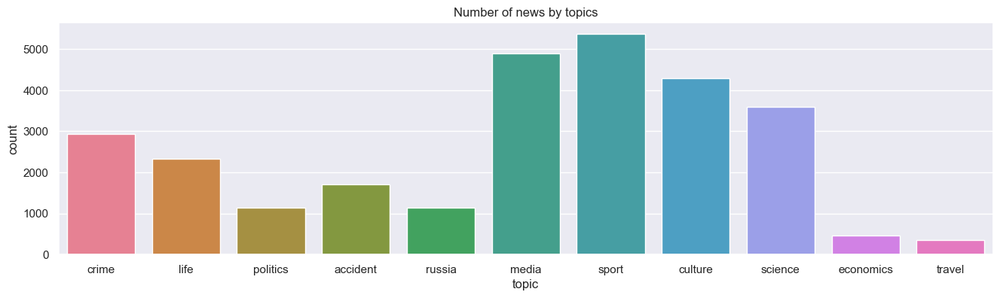

In [13]:
sns.set_palette('tab10')
fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(16,4))
sns.countplot(df, x = "topic", hue = "topic")
plt.title('Number of news by topics')

In [14]:
df.topic.value_counts()

topic
sport        5376
media        4888
culture      4295
science      3590
crime        2932
life         2339
accident     1714
russia       1146
politics     1142
economics     462
travel        349
Name: count, dtype: int64

Сама по себе дата как строка не является признаком, однако ее компоненты могут играть важную роль в работе модели. Поэтому мы преобразуем строковую дату в формат datetime и добавим к нашим признакам год, месяц и день недели.

In [15]:
df['datetime'] = pd.to_datetime(df.datetime)
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.strftime("%B")
df['weekday'] = df['datetime'].dt.strftime('%A')

Какие выводы можно сделать по графикам ниже:
- Практически все новости относятся к 23 году
- Больше всего новостей приходится на осень (сентябрь, октябрь)
- Меньше всего новостей в выходные и больше всего в середине недели

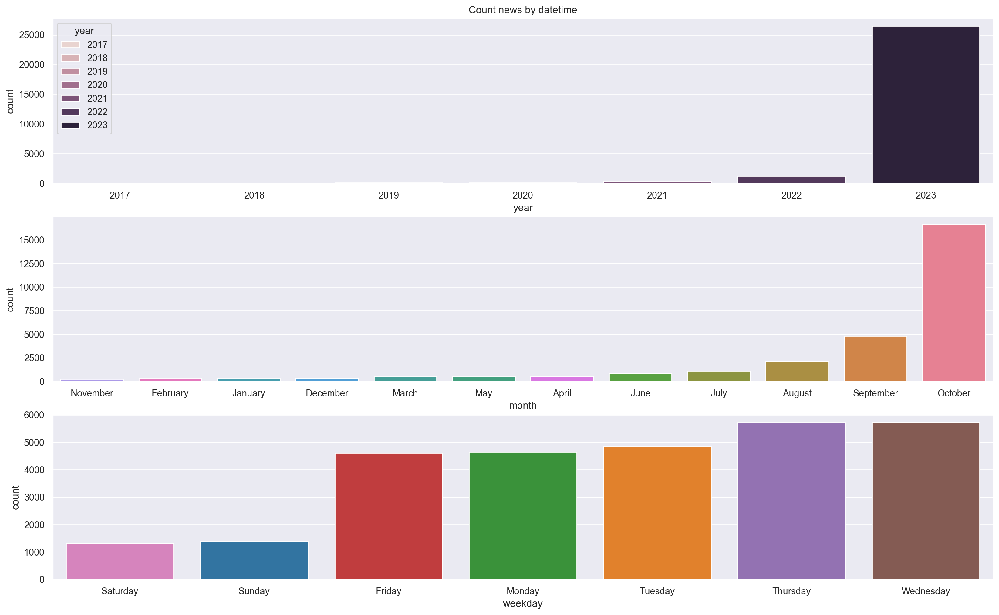

In [16]:
fig, axs = plt.subplots(3, 1, figsize=(20, 12), dpi=200)
for ind, col in enumerate(['year', 'month', 'weekday']):
    sns.set_palette('tab10')
    sns.countplot(df, x=col, hue = col, ax=axs[ind], order=df[col].value_counts(ascending=True).index)
axs[0].set_title('Count news by datetime');

Посчитаем длину заголовка и основного текста.

In [17]:
df['len_title'] = df['title'].str.len()
df['len_content'] = df['content'].str.len()

Посмотрим, как они выглядят в разрезе каждой категории.

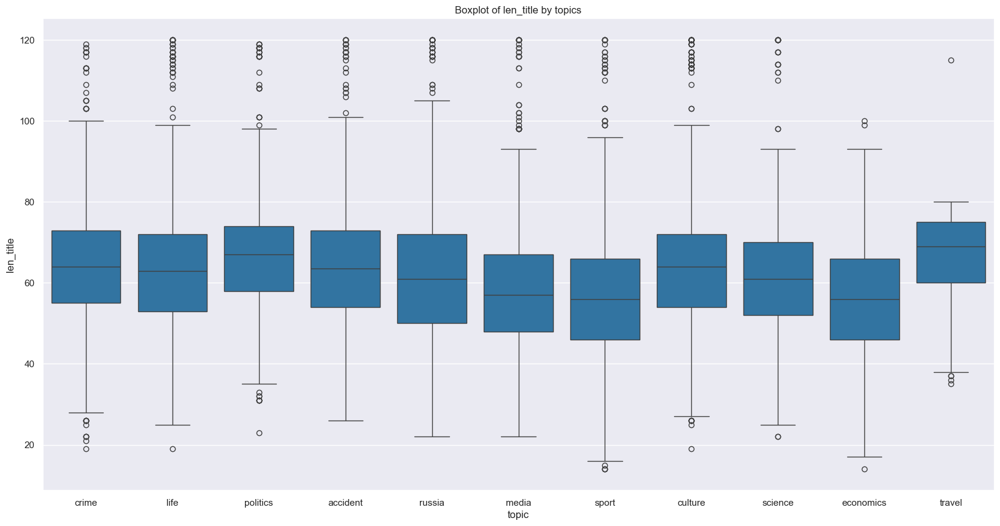

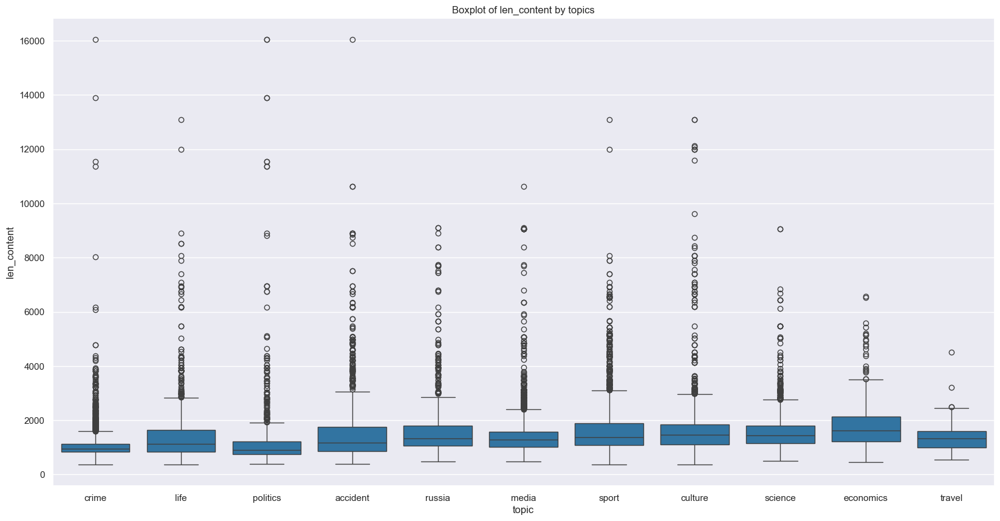

In [18]:
for col in ['len_title', 'len_content']:
    fig, ax = plt.subplots(1, 1, figsize=(20, 10), dpi=100)
    sns.boxplot(x="topic", y=col, data=df, ax=ax)
    plt.title(f'Boxplot of {col} by topics');

Что можно заметить:
- В среднем длина заголовка по всем категориям около 60 с небольшим символов
- Длина текста имеет тяжелые хвосты, особенно по категориям: crime, politics, accident.

Посмотрим на числянное значение медианы по столбцам с длиной заголовка и длиной текста.

In [19]:
print(df['len_title'].median())
print(df['len_content'].median())

61.0
1284.0


Посмотрим, какие ключевые слова чаще всего встречаются в статьях каждой тематики. Одной из гипотез является то, что статьи разных, но при этом близких тематик с одинаковыми ключевыми словами могут вносить негативный вклад в работу модели.

In [20]:
stop_words = stopwords.words('russian')
stop_words.extend(['что', 'это', 'так',
                    'вот', 'быть', 'как',
                    'в', '—', 'к', 'за', 'из', 'из-за',
                    'на', 'ок', 'кстати',
                    'который', 'мочь', 'весь',
                    'еще', 'также', 'свой',
                    'ещё', 'самый', 'ул', 'комментарий',
                    'английский', 'язык', 'рассказал', "рассказали"])

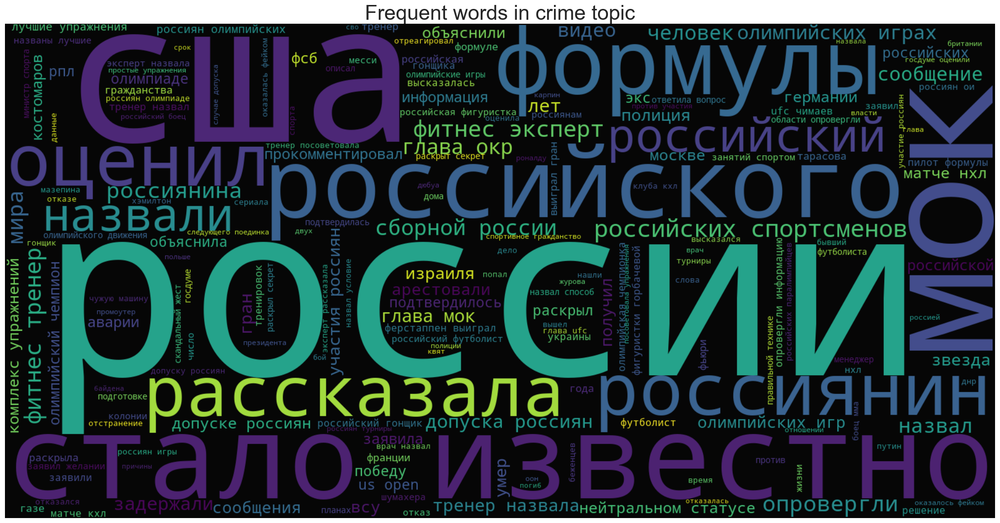

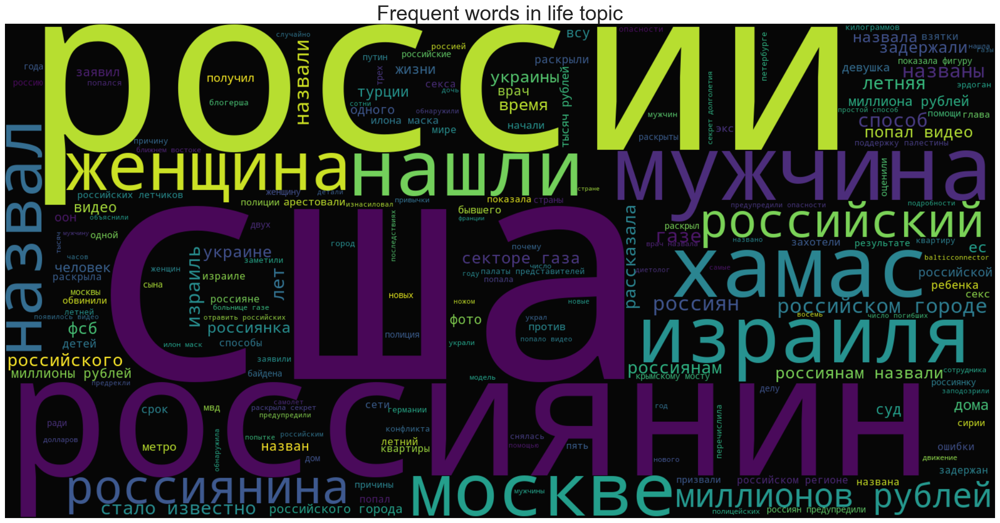

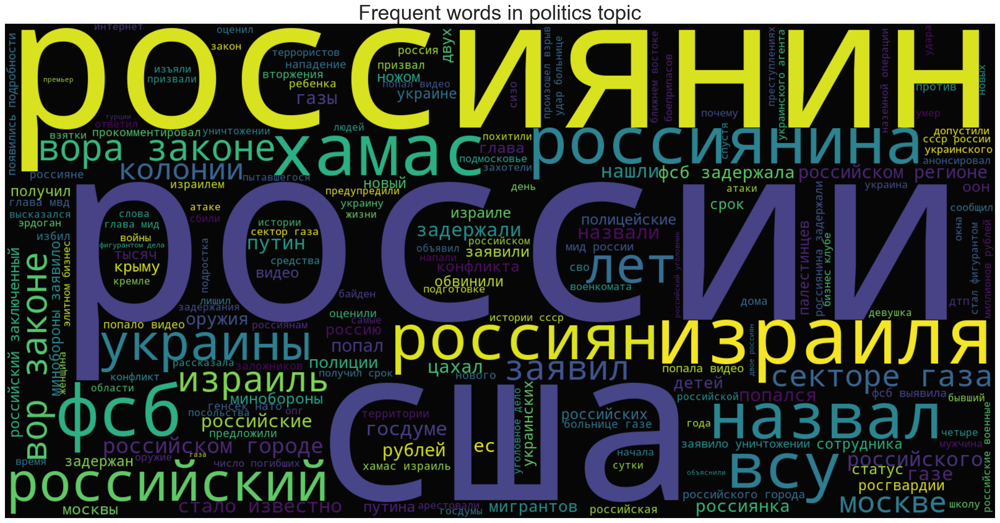

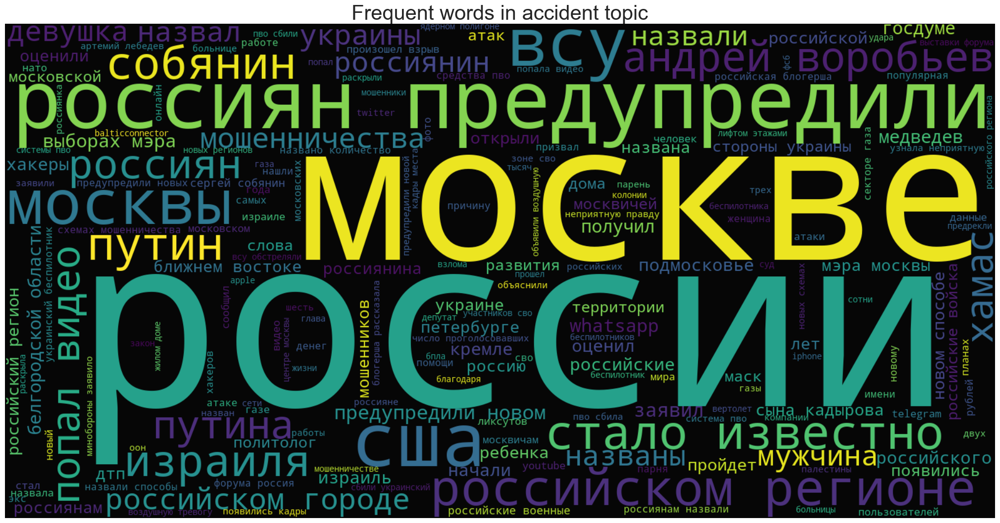

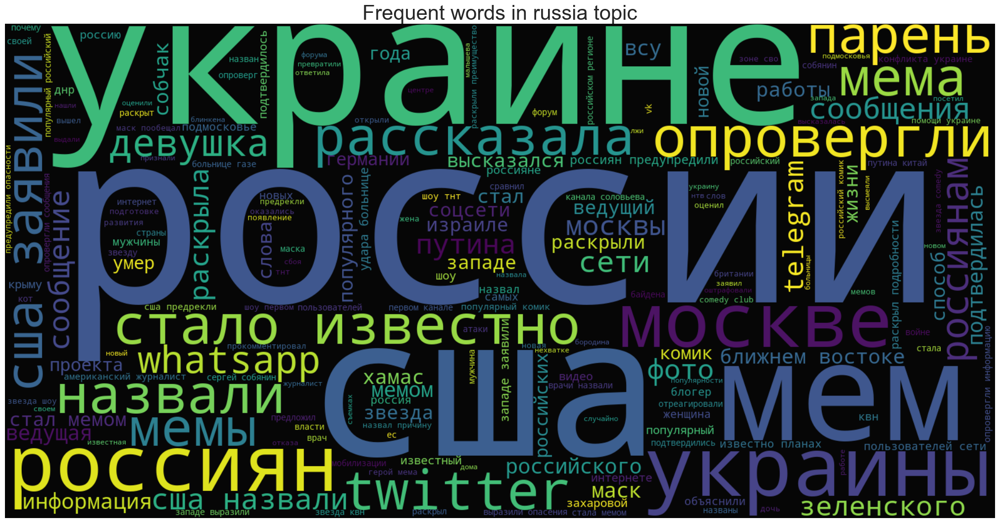

...

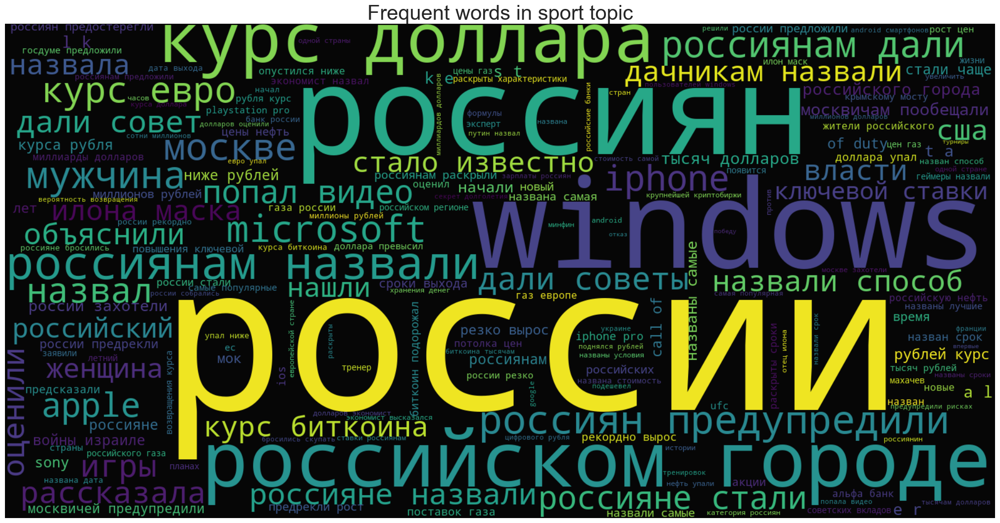

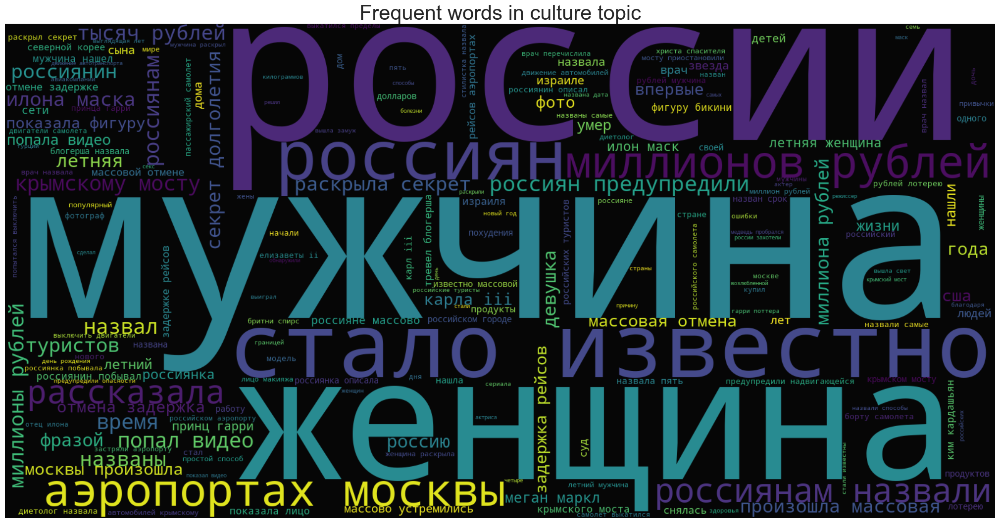

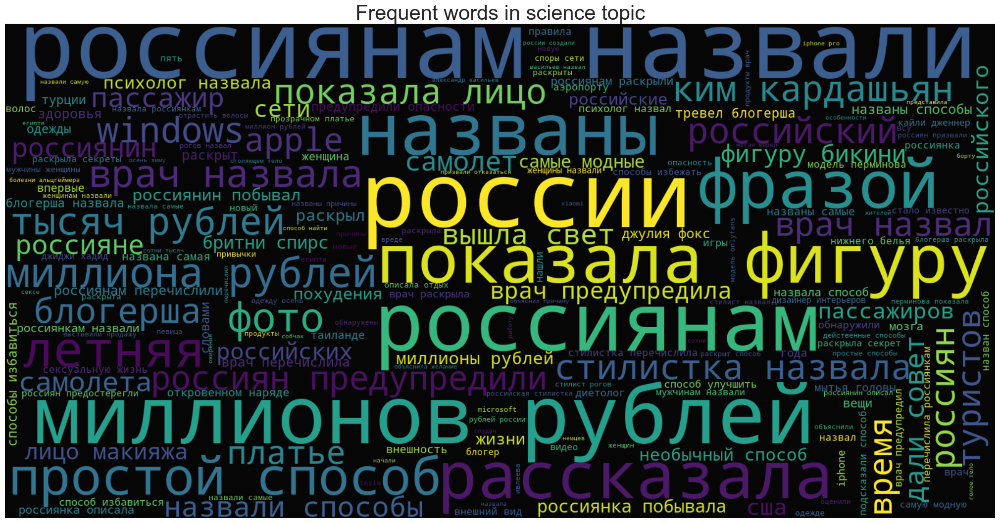

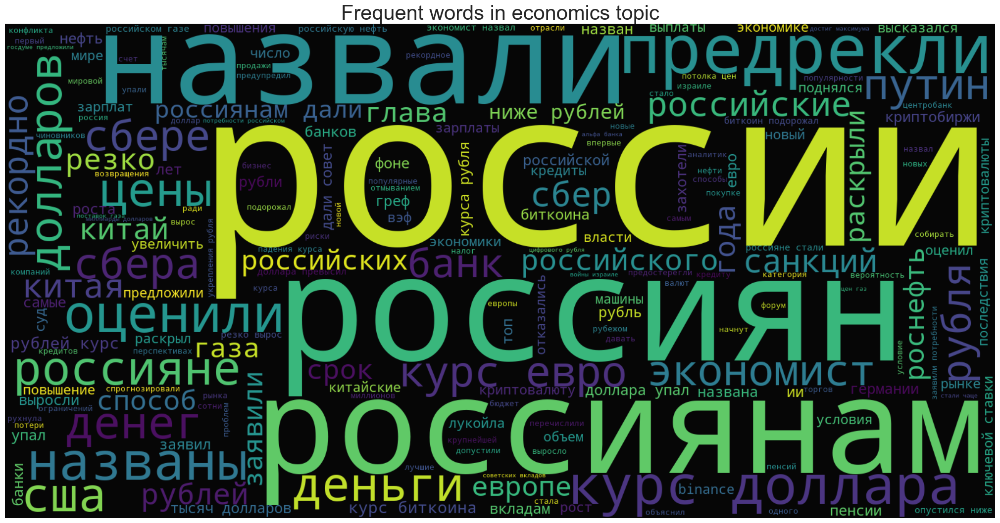

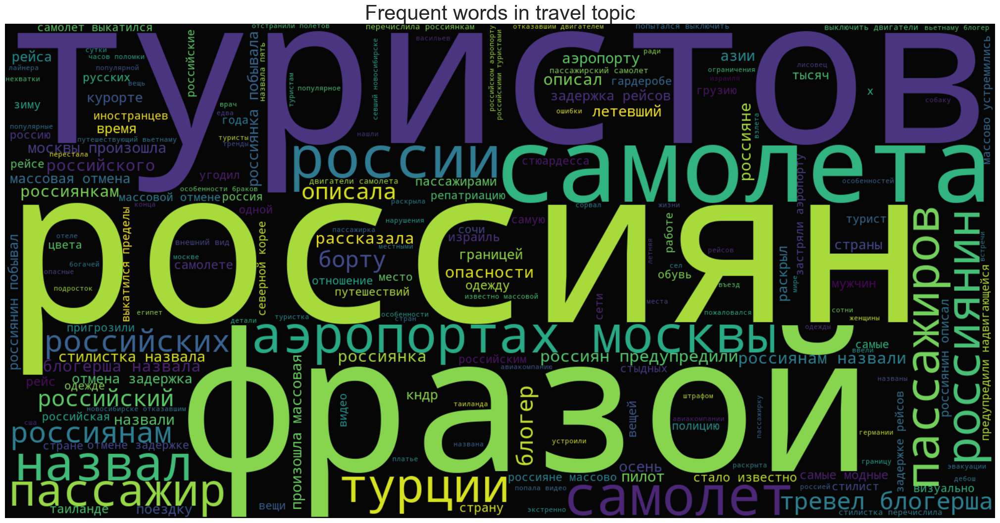

In [21]:
for topic in df.topic.unique():
    words = df[df.topic == topic].title.str.split(' ').explode().values
    words = [word.lower() for word in words if word.lower() not in stop_words]

    wc = WordCloud(background_color="black", width=1600, height=800,  stopwords=stop_words)
    wc.generate(" ".join(words))

    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    plt.axis("off")
    plt.tight_layout(pad=0)
    ax.set_title(f"Frequent words in {topic} topic", fontsize=30)
    ax.imshow(wc, alpha=0.98, interpolation = "bilinear")

Посмотрим распределение возраста статей.

In [22]:
df['lifetime'] = df['datetime'].apply(lambda x: (datetime.datetime.now() - x).total_seconds())
df['lifetime'] = df['lifetime'].apply(lambda x: divmod(x, 60)[0])

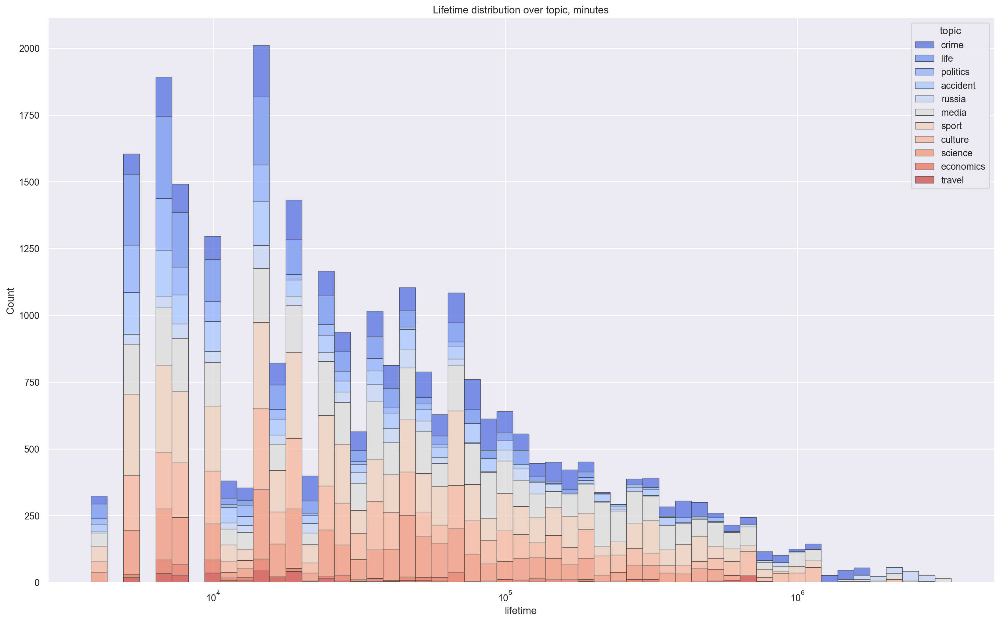

In [23]:
fig, axs = plt.subplots(1, 1, figsize=(20, 12), dpi=200)
sns.despine(fig)

sns.histplot(
    df,
    x="lifetime",
    hue="topic",
    multiple="stack",
    edgecolor=".3",
    palette="coolwarm",
    linewidth=.5,
    log_scale=True,
);
axs.set_title('Lifetime distribution over topic, minutes');

Как и ожидалось, в датасете присутствуют как старые статьи, так и новые.

### Выводы

Итак, на данном этапе мы провели первичный анализ датасета. Статьи распределены неравномерно. Большинство новостнй относятся к 2023 году, а больше всего новостей в сентябре и октябре, но это всё потому, что мы выгружали данные в обратном хронологическом порядке и, соответственно, большая часть статей выпала на этот период. По дням недели на текущих данных можно судить уже больше. Меньше всего новостей выходит в выходные и больше всего в среду и четверг.

В среднем длина заголовка по всем категориям около 61 символов. Длина текста имеет тяжелые хвосты, особенно по категориям crime, politics, accident.

Мы также проанализировали основные ключевые слова, которые наводят на гипотезу о том, что статьи разных тематик могут быть сильно похожи по доминирующим ключевым словам и тем самым негативно влиять на модель. Это нужно будет иметь в виду при построоении модели.

Поскольку мы работаем с текстами, на этом этапе пока не столь очевидно, какие данные и по какой причине стоит считать выбросами, а какие - особенностями конкретной тематики. Поэтому это мы оставим на следующие этапы работы над проектом.